In [ ]:

!pip install tensorflow-gpu==2.0.0
%matplotlib inline



In [ ]:
import pickle

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt


tf.__version__
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
!pip install keras==2.2.4

In [ ]:
# It is GNU radio generated datset which accounts for practical aspect of wieless channels such as ...
# It 220,000 samples. Each sample is 2*128 matrix containing the IQ (2) of a received signal sampled 128 times.
# It contains sample points for 11 diifferent modulation schemes (BPSK,QAM,8PSK,...) at 20 different SNR levels, which adds up to 220 tuples of ('modulation',SNR) where for each tuple we have 1000 samples of dimenssion 2*128.

def to_onehot(yin):
    yy = list(yin) # This is a workaround as the map output for python3 is not a list
    yy1 = np.zeros([len(list(yy)), max(yy)+1])
    yy1[np.arange(len(list(yy))),yy] = 1
    return yy1
    

def ModCls_loaddata(path_to_dataset):
    # There is a Pickle incompatibility of numpy arrays between Python 2 and 3
    # which generates ascii encoding error, to work around that we use the following instead of
    # Xd = cPickle.load(open("RML2016.10a_dict.dat",'rb'))
    with open(path_to_dataset, 'rb') as open_file:
        u = pickle._Unpickler( open_file )
        u.encoding = 'latin1'
        Xd = u.load()
    
    snrs,mods = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd.keys())))), [1,0])
    X = []  
    lbl = []
    for mod in mods:
        for snr in snrs:
            X.append(Xd[(mod,snr)])
            for i in range(Xd[(mod,snr)].shape[0]):  lbl.append((mod,snr))
    X = np.vstack(X)
    
    # Partition the data
    #  into training and test sets of the form we can train/test on 
    #  while keeping SNR and Mod labels handy for each
    np.random.seed(2016)
    n_examples = X.shape[0]
    n_train = int(n_examples * 0.5)
    train_idx = np.random.choice(range(0,n_examples), size=n_train, replace=False)
    test_idx = list(set(range(0,n_examples))-set(train_idx))
    X_train = X[train_idx]
    X_test =  X[test_idx]
    
    Y_train = to_onehot(map(lambda x: mods.index(lbl[x][0]), train_idx))
    Y_test = to_onehot(map(lambda x: mods.index(lbl[x][0]), test_idx))
    
    in_shp = list(X_train.shape[1:])
    classes = mods
    return X,lbl,X_train,X_test,classes,snrs,mods,Y_train,Y_test,train_idx,test_idx

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive


In [ ]:

!ls 'My Drive/Colab Notebooks/Notebooks/'

 215_FP_2.ipynb     'Mini-project 3'	  Untitled0.ipynb   Untitled5.ipynb
'homework=1.ipynb'   model.h5		  Untitled1.ipynb   Untitled6.ipynb
 homework-1.ipynb    MOD.pkl		  Untitled2.ipynb
 hw1-275-.ipynb      Pre-training.ipynb   Untitled3.ipynb
 LICENSE.TXT	     Untitled		  Untitled4.ipynb


In [ ]:
X,lbl,X_train,X_test,classes,snrs,mods,Y_train,Y_test,train_idx,test_idx = ModCls_loaddata(
    'My Drive/Colab Notebooks/Notebooks/MOD.pkl')


print('X_train.shape:', X_train.shape)
print('Y_train.shape:', Y_train.shape)
print(X.shape)
print(len(lbl))



print('Y_train[4:9]: \n', Y_train[4:9])
print('train_idx.shape:', train_idx.shape)
print('train_idx[4:9]:', train_idx[4:9])
print(lbl[train_idx[4]], lbl[train_idx[5]], lbl[train_idx[6]], lbl[train_idx[7]], lbl[train_idx[8]], lbl[train_idx[9]])

print('classes:', classes)

X_train.shape: (110000, 2, 128)
Y_train.shape: (110000, 11)
(220000, 2, 128)
220000
Y_train[4:9]: 
 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
train_idx.shape: (110000,)
train_idx[4:9]: [184829 192624 169402 179790 145554]
('QPSK', -12) ('QPSK', 4) ('QAM64', -2) ('QAM64', 18) ('QAM16', -10) ('BPSK', -2)
classes: ['8PSK', 'AM-DSB', 'AM-SSB', 'BPSK', 'CPFSK', 'GFSK', 'PAM4', 'QAM16', 'QAM64', 'QPSK', 'WBFM']


In [ ]:
X_train.shape

(110000, 2, 128)

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
import numpy as np
import argparse
import cv2
import os
from imutils import paths
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.resnet_v2 import ResNet152V2
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import cv2
import os

Using TensorFlow backend.


[2, 128]

In [ ]:
# The CNN Network
list(X_train.shape[1:])

in_shp = list(X_train.shape[1:])
dr = 0.5 # dropout rate (%)
in_shp

In [ ]:
tf.keras.layers.Reshape([1]+in_shp, input_shape=in_shp)

In [ ]:
x2 = np.reshape(X_train, (-1, 2,128,1))

In [ ]:
x2.shape

(110000, 2, 128, 1)

In [ ]:
x3 = np.reshape(X_test, (-1, 2,128,1))

In [ ]:
x3.shape

(110000, 2, 128, 1)

In [ ]:
x_train=x2
y_train=Y_train
x_valid=x3
y_valid=Y_test


In [ ]:
from keras.datasets import cifar10

In [ ]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

170500096/170498071 [==============================] - 11s 0us/step


In [ ]:
x_train = x_train.astype('float32')
x_valid = x_valid.astype('float32')
x_train /= 255
x_valid /= 255


In [ ]:
from tensorflow.keras import utils
y_train = utils.to_categorical(y_train, 11)
y_valid = utils.to_categorical(y_valid, 11)

In [ ]:
x3[1]

In [ ]:
y_train.shape

(110000, 11)

In [ ]:
o = np.zeros((224, 224, 3))

In [ ]:
y_train.shape

(110000, 11)

In [ ]:
X_train[1].shape

(2, 128)

In [ ]:
#==============================================================================
# Build VT-CNN2 Neural Net model using Keras
#  - Reshape [N,2,128] to [N,1,2,128] on input
#  - Pass through 2 2DConv/ReLu layers
#  - Pass through 2 Dense layers (ReLu and Softmax)
#  - Perform categorical cross entropy optimization



<tf.Tensor 'input_1:0' shape=(None, None, None, 1) dtype=float32>

In [ ]:
from __future__ import print_function
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Layer
from tensorflow.keras import activations
from tensorflow.keras import utils
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import keras
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import optimizers

K.set_image_data_format('channels_last')

def squash(x, axis=-1):
    s_squared_norm = K.sum(K.square(x), axis, keepdims=True) + K.epsilon()
    scale = K.sqrt(s_squared_norm) / (1 + s_squared_norm)
    return scale * x


def softmax(x, axis=-1):
    
    ex = K.exp(x - K.max(x, axis=axis, keepdims=True))
    return ex / K.sum(ex, axis=axis, keepdims=True)


def margin_loss(y_true, y_pred):
    
    lamb, margin = 0.5, 0.1
    return K.sum((y_true * K.square(K.relu(1 - margin - y_pred)) + lamb * (
        1 - y_true) * K.square(K.relu(y_pred - margin))), axis=-1)


class Capsule(Layer):
   

    def __init__(self,
                 num_capsule,
                 dim_capsule,
                 routings=3,
                 share_weights=True,
                 activation='squash',
                 **kwargs):
        super(Capsule, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings
        self.share_weights = share_weights
        if activation == 'squash':
            self.activation = squash
        else:
            self.activation = activations.get(activation)
            
    def get_config(self):
        config = super().get_config().copy()
        config.update({
        'num_capsule':  self.num_capsule,
        'dim_capsule' : self.dim_capsule,
        'routings':  self.routings,
        'share_weight':self.share_weights,
        
       
           
        })
        return config

    def build(self, input_shape):
        input_dim_capsule = input_shape[-1]
        if self.share_weights:
            self.kernel = self.add_weight(
                name='capsule_kernel',
                shape=(1, input_dim_capsule,
                       self.num_capsule * self.dim_capsule),
                initializer='glorot_uniform',
                trainable=True)
        else:
            input_num_capsule = input_shape[-2]
            self.kernel = self.add_weight(
                name='capsule_kernel',
                shape=(input_num_capsule, input_dim_capsule,
                       self.num_capsule * self.dim_capsule),
                initializer='glorot_uniform',
                trainable=True)

    def call(self, inputs):
        

        if self.share_weights:
            hat_inputs = K.conv1d(inputs, self.kernel)
        else:
            hat_inputs = K.local_conv1d(inputs, self.kernel, [1], [1])

        batch_size = K.shape(inputs)[0]
        input_num_capsule = K.shape(inputs)[1]
        hat_inputs = K.reshape(hat_inputs,
                               (batch_size, input_num_capsule,
                                self.num_capsule, self.dim_capsule))
        hat_inputs = K.permute_dimensions(hat_inputs, (0, 2, 1, 3))

        b = K.zeros_like(hat_inputs[:, :, :, 0])
        for i in range(self.routings):
            c = softmax(b, 1)
            o = self.activation(keras.backend.batch_dot(c, hat_inputs, [2, 2]))
            if i < self.routings - 1:
                b = keras.backend.batch_dot(o, hat_inputs, [2, 3])
                if K.backend() == 'theano':
                    o = K.sum(o, axis=1)

        return o


    def compute_output_shape(self, input_shape):
        return (None, self.num_capsule, self.dim_capsule)




batch_size = 16  
num_classes = 11
epochs = 100



#class weights to handle class imbalance

#class_weights = {0: 1-np.count_nonzero(y_train==0)/len(y_train),
              #  1: 1-np.count_nonzero(y_train==1)/len(y_train)} 



input_image = Input(shape=(None, None, 1))
x = Conv2D(64, (3, 3),padding="same", activation='relu')(input_image)
x=BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)(x)
x = Conv2D(64, (3, 3),padding="same", activation='relu')(x)
x = AveragePooling2D((2, 2),padding="same",trainable = False)(x)
x = Conv2D(128, (3, 3),padding="same", activation='relu')(x)
x = Conv2D(128, (3, 3),padding="same", activation='relu')(x)


x = Reshape((-1, 128))(x)
capsule = Capsule(11, 16, 3, True)(x)
output = Lambda(lambda z: K.sqrt(K.sum(K.square(z), 2)))(capsule)
model = Model(inputs=input_image, outputs=output)

# we use a margin loss
model.compile(loss=margin_loss, optimizer='adam', metrics=['accuracy'])
model.summary()

data_augmentation = False
# The best model is selected based on the loss value on the validation set


filepath='My Drive/Colab Notebooks/notebooks/weights.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [checkpoint]





if not data_augmentation:
    print('Not using data augmentation.')
    model.fit(
        [x_train], [y_train],
        batch_size=batch_size,
        epochs=epochs,
        validation_data=[[x_valid], [y_valid]],
        shuffle=True,callbacks=callbacks_list)
    
else:
    print('Using real-time data augmentation.')
    # This will do preprocessing and realtime data augmentation:
    datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by dataset std
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        zca_epsilon=1e-06,  # epsilon for ZCA whitening
        rotation_range=0.1,  # randomly rotate images in 0 to 180 degrees
        width_shift_range=0.1,  # randomly shift images horizontally
        height_shift_range=0.1,  # randomly shift images vertically
        brightness_range=[0.5,1.5],
        shear_range=0.1,  # set range for random shear
        zoom_range=0.1,  # set range for random zoom
        channel_shift_range=0.,  # set range for random chann el shifts
        # set mode for filling points outside the input boundaries
        fill_mode='nearest',
        cval=0.,  # value used for fill_mode = "constant"
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True,  # randomly flip images
        # set rescaling factor (applied before any other transformation)
        rescale=None,
        # set function that will be applied on each input 
        preprocessing_function=None,
        # image data format, either "channels_first" or "channels_last"
        data_format=None,
        # fraction of images reserved for validation (strictly between 0 and 1)
        validation_split=0.0)

    # Compute quantities required for feature-wise normalization
    # (std, mean, and principal components if ZCA whitening is applied).
    datagen.fit(x_train)

    # Fit the model on the batches generated by datagen.flow().
    model.fit(
        datagen.flow(x_train, y_train, batch_size=batch_size),
        epochs=epochs,
        validation_data=(x_valid, y_valid),shuffle=True)

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, None, None, 64)    640       
_________________________________________________________________
batch_normalization_3 (Batch (None, None, None, 64)    256       
_________________________________________________________________
conv2d_13 (Conv2D)           (None, None, None, 64)    36928     
_________________________________________________________________
average_pooling2d_3 (Average (None, None, None, 64)    0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, None, None, 128)   73856     
_________________________________________________________________
conv2d_15 (Conv2D)           (None, None, None, 128)   1475

In [ ]:
bs=1024

In [ ]:
score = model.evaluate(x_valid, y_valid, verbose=1, batch_size=bs)
print(score)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.3486373400558125, 0.5252454]


In [ ]:
def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Blues, labels=[]):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(labels))
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

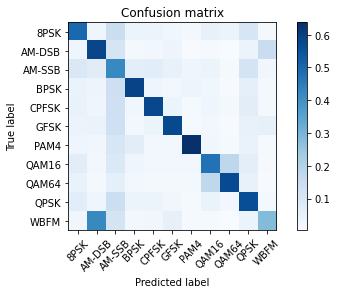

In [ ]:
test_Y_hat = model.predict(x_valid, batch_size=batch_size)
conf = np.zeros([len(classes),len(classes)])
confnorm = np.zeros([len(classes),len(classes)])
for i in range(0,X_test.shape[0]):
    j = list(Y_test[i,:]).index(1)
    k = int(np.argmax(test_Y_hat[i,:]))
    conf[j,k] = conf[j,k] + 1
for i in range(0,len(classes)):
    confnorm[i,:] = conf[i,:] / np.sum(conf[i,:])
plot_confusion_matrix(confnorm, labels=classes)





In [ ]:

x4 = np.reshape(test_X_i, (-1, 2,128,1))


In [ ]:
x4.shape

(5465, 2, 128, 1)

Overall Accuracy:  0.09551692589204025
Overall Accuracy:  0.09591280653950954
Overall Accuracy:  0.09732272069464544
Overall Accuracy:  0.11097076867556839
Overall Accuracy:  0.1301731996353692
Overall Accuracy:  0.1754043006930869
Overall Accuracy:  0.2401249311041705
Overall Accuracy:  0.34787390029325516
Overall Accuracy:  0.48428835489833644
Overall Accuracy:  0.6380624092888244
Overall Accuracy:  0.7304744525547445
Overall Accuracy:  0.7837150127226463
Overall Accuracy:  0.8215859030837004
Overall Accuracy:  0.8296028880866426
Overall Accuracy:  0.8201983769161406
Overall Accuracy:  0.8284153005464481
Overall Accuracy:  0.8196632265073329
Overall Accuracy:  0.8176785384757336
Overall Accuracy:  0.8180995475113122
Overall Accuracy:  0.8226822682268227


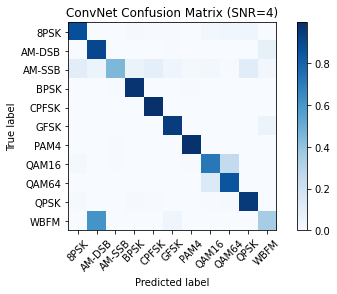

In [ ]:
# Plot confusion matrix
acc = {}
for snr in snrs:

    # extract classes @ SNR
    test_SNRs = list(map(lambda x: lbl[x][1], test_idx))
    test_X_i = x_valid[np.where(np.array(test_SNRs)==snr)]
    test_Y_i = y_valid[np.where(np.array(test_SNRs)==snr)]    

    # estimate classes
    test_Y_i_hat = model.predict(test_X_i)
    conf = np.zeros([len(classes),len(classes)])
    confnorm = np.zeros([len(classes),len(classes)])
    for i in range(0,test_X_i.shape[0]):               
        j = list(test_Y_i[i,:]).index(1)
        k = int(np.argmax(test_Y_i_hat[i,:]))
        conf[j,k] = conf[j,k] + 1
    for i in range(0,len(classes)):
        confnorm[i,:] = conf[i,:] / np.sum(conf[i,:])
    
    if snr==4:
      plt.figure()
      plot_confusion_matrix(confnorm, labels=classes, title="ConvNet Confusion Matrix (SNR=%d)"%(snr))
    
    cor = np.sum(np.diag(conf))
    ncor = np.sum(conf) - cor
    print("Overall Accuracy: ", cor / (cor+ncor))
    acc[snr] = 1.0*cor/(cor+ncor)

In [ ]:
# Show loss curves 
plt.figure()
plt.title('Training performance')
plt.plot(history.epoch, history.history['loss'], label='train loss+error')
plt.plot(history.epoch, history.history['val_loss'], label='val_error')
plt.legend()


Text(0.5, 1.0, 'CNN2 Classification Accuracy on RadioML 2016.10 Alpha')

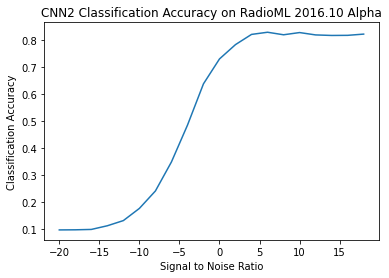

In [ ]:

# Plot accuracy curve
plt.plot(snrs, list(map(lambda x: acc[x], snrs)))
plt.xlabel("Signal to Noise Ratio")
plt.ylabel("Classification Accuracy")
plt.title("CNN2 Classification Accuracy on RadioML 2016.10 Alpha")

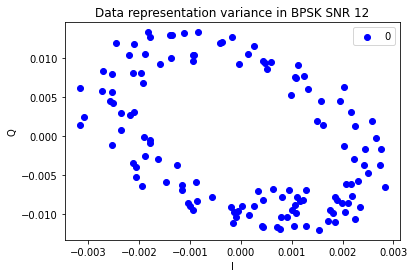

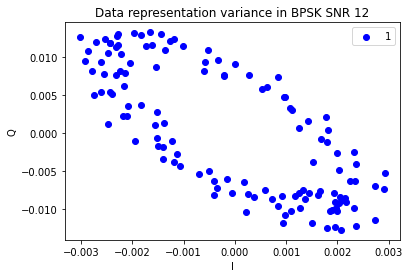

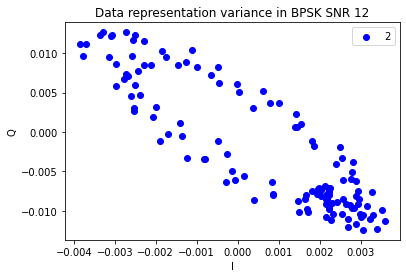

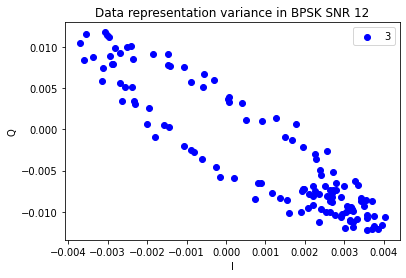

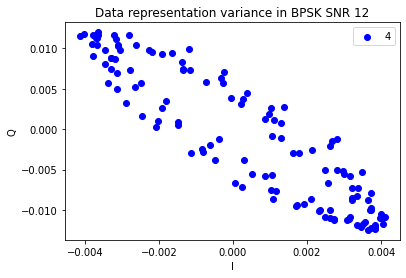

...

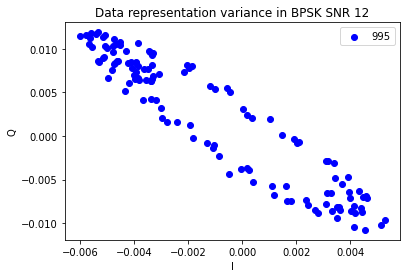

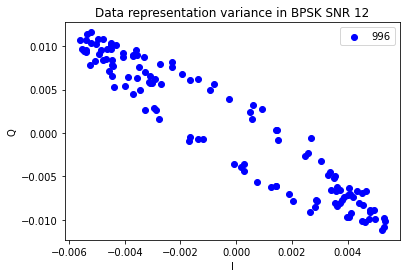

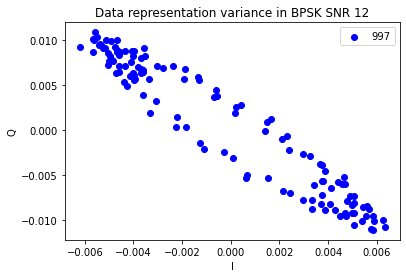

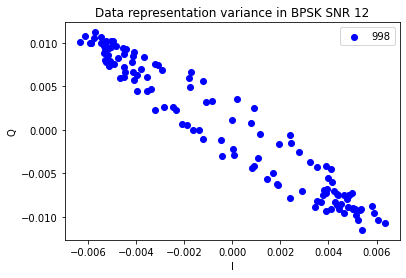

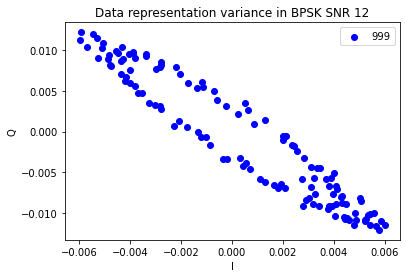

In [ ]:
import pickle
import random, sys, keras
import pandas as pd
import numpy as np

with open('My Drive/Colab Notebooks/MOD.pkl', 'rb') as open_file:
        u = pickle._Unpickler( open_file )
        u.encoding = 'latin1'
        Xd = u.load()
snrs,mods = map(lambda j: sorted(list(set(map(lambda x: x[j], Xd.keys())))), [1,0])
X = []
Y=[]
lbl = []
for mod in mods:
  for snr in snrs:
    if(mod=='BPSK'and snr==12):
      test = Xd[(mod,snr)]
      #print(test)
      X.append(Xd[(mod,snr)])
      for i in range(Xd[(mod,snr)].shape[0]):  
        lbl.append((mod,snr))
        Y.append([test[0]+1j*test[1]])
X = np.vstack(X)
Y= np.vstack(Y)

df= pd.DataFrame(lbl,columns=["mod","snr"])
df['snr'].value_counts()
ind = []
for i in range(0,df.shape[0]):
  if(df['snr'][i]==16):
    ind.append(i)

import matplotlib.pyplot as plt
for i in range(0,1000,1):
    x = X[i][0]
    y= X[i][1]
    fig = plt.figure()
    plt.scatter(x,y,c='blue',label=i)
    plt.xlabel("I")
    plt.ylabel("Q")
    plt.title("Data representation variance in BPSK SNR 12")
    plt.legend()
    plt.show()
#fig.savefig(path+"/IQ trained images/snr/%d.png"  % i)



In [ ]:
predict=model.predict([x_valid])
predict=np.argmax(predict,axis=1)

In [ ]:
y_test=np.argmax(y_valid,axis=1)

In [ ]:
x_test=x_valid

In [ ]:
accuracy_before=0
specificity_before=0
sensitivity_before=0
precision_before=0
f1_before=0
newaccuracy=0
from __future__ import print_function
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Layer
from tensorflow.keras import activations
from tensorflow.keras import utils
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
import numpy as np
import keras
from sklearn.metrics import roc_curve, auc
from matplotlib import pyplot as plt

summation1=0

for i in range(len(x_test)):
    if predict[i]==y_test[i]:
        summation1=summation1+1
print('accurate predictions: ',summation1) 
print('Total predictions to be made in testing :', len(x_test))     
accuracy_before=summation1/len(x_test)
print('overall accuracy for all classes: ',accuracy_before) 



summation1=0
summation2=0
summation3=0
summation4=0
for j in range(0,11):
        for i in range(len(x_test)):
            if predict[i]==y_test[i] and y_test[i]==j:
                summation1=summation1+1
                

        for i in range(len(y_test)):
          if y_test[i]==j:
            summation2=summation2+1

        newaccuracy=((summation1)/(summation2))


        print('accuracy for class',j+1,'is: ',newaccuracy)


accurate predictions:  57777
Total predictions to be made in testing : 110000
overall accuracy for all classes:  0.5252454545454546
accuracy for class 1 is:  0.49698288653674944
accuracy for class 2 is:  0.5400140224358975
accuracy for class 3 is:  0.5004175435080336
accuracy for class 4 is:  0.5226515739650898
accuracy for class 5 is:  0.5341590011823885
accuracy for class 6 is:  0.5413208649912332
accuracy for class 7 is:  0.5550753466805959
accuracy for class 8 is:  0.5450904813155457
accuracy for class 9 is:  0.5481100803132439
accuracy for class 10 is:  0.5497768348577947
accuracy for class 11 is:  0.5252454545454546


Performance of model
-----------------------------------------------------------------------------------------------
                                                                                                
Accuracy score: 0.5252454545454546
Precision score: 0.5503723921279862
Recall score: 0.5252454545454546
F1 score: 0.531007926737766
[[5024  313 1464  414  392  268  154  517  376 1049  138]
 [ 281 5759 1090  160  210  338   70  113   31  350 1457]
 [ 921  731 4198  666  714  489  294  403  117 1160  276]
 [ 435  333 1371 5889  305  216  351  268   68  622  136]
 [ 469  318 1353  278 5784  362  130  279  160  696  139]
 [ 391  434 1347  218  425 5763  118  193   60  477  560]
 [ 294  243 1065  676  208  195 6370  257  111  467  106]
 [ 684  226  924  299  228  191  202 4769 1784  638   84]
 [ 471  154  614  205  176  144  168 1762 5718  520   60]
 [ 710  298 1416  420  363  250  128  437  199 5663  144]
 [ 242 4250 1136  191  252  548   82  115   44  374 2840]]
Plotting confus

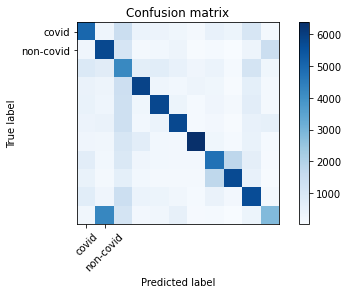

              precision    recall  f1-score   support

           0       0.51      0.50      0.50     10109
           1       0.44      0.58      0.50      9859
           2       0.26      0.42      0.32      9969
           3       0.63      0.59      0.61      9994
           4       0.64      0.58      0.61      9968
           5       0.66      0.58      0.61      9986
           6       0.79      0.64      0.71      9992
           7       0.52      0.48      0.50     10029
           8       0.66      0.57      0.61      9992
           9       0.47      0.56      0.51     10028
          10       0.48      0.28      0.35     10074

    accuracy                           0.53    110000
   macro avg       0.55      0.53      0.53    110000
weighted avg       0.55      0.53      0.53    110000



In [ ]:
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix, classification_report




# Plot a confusion matrix.
# cm is the confusion matrix, names are the names of the classes.
def plot_confusion_matrix(cm, names, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(names))
    plt.xticks(tick_marks, names, rotation=45)
    plt.yticks(tick_marks, names)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    

# Plot an ROC. pred - the predictions, y - the expected output.
def plot_roc(pred,y):
    fpr, tpr, thresholds = roc_curve(y, pred)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    plt.show()

print('Performance of model')
print('-----------------------------------------------------------------------------------------------')
print('                                                                                                ')
pred=predict
y_true= np.argmax(Y_test,axis=1) 

score = metrics.accuracy_score(y_true, pred)

print("Accuracy score: {}".format(score))


score = metrics.precision_score(y_true, pred, average= "weighted")
print("Precision score: {}".format(score))

score = metrics.recall_score(y_true, pred, average= "weighted")
print("Recall score: {}".format(score))


score = metrics.f1_score(y_true, pred, average= "weighted")
print("F1 score: {}".format(score))


# Compute confusion matrix
cm = confusion_matrix(y_true, pred)
print(cm)


print('Plotting confusion matrix')

lab =['covid','non-covid']
plt.figure()
plot_confusion_matrix(cm, lab)
plt.show()


print(classification_report(y_true, pred))